In [1]:
from torchvision import transforms
from PIL import Image
import os
from torchvision.transforms import v2
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2
import csv

from tqdm import tqdm

import torch
import torchvision.transforms as T
import random
from sklearn.metrics import f1_score
import glob

# from Datasets import DATASET_REGISTRY

from skimage.feature import peak_local_max
from skimage import img_as_float
from scipy import ndimage as ndi

from segment_anything import sam_model_registry, SamPredictor

In [2]:
# Path to local clone of the repo
REPO_DIR = "dinov3"

# Path to the downloaded checkpoint
CHECKPOINT_PATH = "dinov3_vits16_pretrain_lvd1689m-08c60483.pth"

# Load the model
model = torch.hub.load(REPO_DIR, 'dinov3_vits16', source='local', weights=CHECKPOINT_PATH)

model.eval()
print("Model loaded successfully!")

Model loaded successfully!


In [3]:

#From the meta github page:
def make_transform(resize_size: int = 256):
    to_tensor = v2.ToImage()
    resize = v2.Resize((resize_size, resize_size), antialias=True)
    to_float = v2.ToDtype(torch.float32, scale=True)
    normalize = v2.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
    )
    return v2.Compose([to_tensor, resize, to_float, normalize])

pre_process = make_transform(resize_size = 256) #Could change size if we want


# SAM functions
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   


# A class structure with metods that can calculate anomaly maps/heatmaps and scores.
class Calculate_Anomaly_And_Mask:
    """
    Does anomaly score calculation, and mask segnemtation(ish)
    Inputs:
    Model - Whatever pretrained torch model that we are currently using (only really works for DinoV3 so far.)
    Training_Data - All the images that we use for "training" which in this case is just feature extraction.
    Test_Data - All the pictures which are different/anomalous in some respect, and also the normal pictures which we can compare with.
    """
    
    def __init__(self, model, TrainData, TestData, optional_param=None, rescale_training=False, rescale_test = False, rescale_factor=1.0):
        """
        Can also print some segmentation maps for visual inspection.
        """
        # Instance variables
        self.model = model
        self.TrainData = TrainData
        self.TestData = TestData
        self.optional_param = optional_param # we never did use these...
        
        # Computed/internal variables
        self._private_var = None
        self.result = None
        self.G_cls_Tokens_Train = None
        self.G_cls_Tokens_Test = None
        self.P_cls_Tokens_Test = None
        self.N = None
        self.similarity_mode = "cosine"
        self.Anomaly_Scores = None
        # user settings
        self.rescale_training = rescale_training
        self.rescale_factor = rescale_factor
        self.rescale_test = rescale_test
        
    def Get_cls_Tokens_Global(self, Data):
        """
        This metod uses the model to extract global cls tokens.
        
        Parameters:
        -----------
        Data : PIL loaded Images in a list format, where we can loop over and extract tokens (and save them in another list ;P)
            
            
        Returns:
        --------
        List of tensors with cls_tokens.
        """
        cls_tokens = [] #Preallocate a list

        self.model.eval()
        with torch.no_grad():
            for img in Data:
                #Preprocess the image
                img_tensor = pre_process(img).unsqueeze(0)
                #Get features from the model
                features_dict = self.model.forward_features(img_tensor)
                #Get global cls features
                cls = features_dict["x_norm_clstoken"]  # shape [1, C]
                #Append to the list.
                cls_tokens.append(cls.squeeze(0))  # shape [C]
        return cls_tokens
    
    def Get_cls_Tokens_Patch(self, Data):
        """
        Here we get the patch level cls tokens from the images, and agian save them in a list. Each patch is 16x16.

        """
        Patch_Tokens = []
        self.model.eval()
        with torch.no_grad():
            for img in Data:
                #Preprocess the image
                img_tensor = pre_process(img).unsqueeze(0)
                #Get features from the model
                features_dict = self.model.forward_features(img_tensor)
                #Get global cls patch features
                Patch = features_dict["x_norm_patchtokens"]  # shape [1, C]
                #Append to the list.
                Patch_Tokens.append(Patch.squeeze(0))  # → shape [C]
        # print(f'Patch token size: {np.array(Patch_Tokens).shape}')

        return Patch_Tokens
    
    def Get_Consine_Simlilarity(self, Patch_cls, Global_cls):
        """
        This function calculates the consine similarity between global cls tokens from an image, and the patch level embeddings from an image.
        """
        sim = F.cosine_similarity(Patch_cls, Global_cls.unsqueeze(0), dim=-1)

        return sim
    
    def Get_Cosine_Simlilarity_pp(self, Patch_cls1, Patch_cls2):
        """
        This function calculates the consine similarity between patch level features between two images.
        """
        sim = F.cosine_similarity(Patch_cls1, Patch_cls2, dim = -1)

        return sim
        

    def compute_similarity(self, x, y): #Default is cosine. This is just a more general version hehe. #Also, the rest dont have good results, and meta also has their demo with cosine.
        mode = self.similarity_mode
        if mode == "cosine":
            return F.cosine_similarity(x, y, dim=-1)
        elif mode == "dot":
            return (x * y).sum(dim=-1)
        elif mode == "l2":
            return torch.norm(x - y, dim=-1)
        elif mode == "mahalanobis":
            return self.compute_mahalanobis(x, y)
        else:
            raise ValueError(f"Unknown similarity type: {mode}")

    def UpsampleImage(self, Image):
        # Upsample from 16×16 to 256×256 using PyTorch
        heatmap_up = F.interpolate(
            Image.unsqueeze(0).unsqueeze(0),  
            size=(256, 256),
            mode="bicubic",
            align_corners=False
        )[0, 0].cpu().numpy()
        return heatmap_up
    
    def UpsampleImage_By_Amount(self, img_tensor, amount):
        """
        Upsamples an image by an amount, i had to use chatgpt for debugging a lot here.
        """
        if img_tensor.ndim == 3: 
            img_tensor = img_tensor.permute(2,0,1)  # → (C,H,W)

        c, h, w = (img_tensor.shape if img_tensor.ndim == 3 
                else (1,) + tuple(img_tensor.shape))

        new_h = int(h * amount)
        new_w = int(w * amount)

        img_tensor = img_tensor.unsqueeze(0)  # → (1,C,H,W)

        out = F.interpolate(
            img_tensor,
            size=(new_h, new_w),
            mode="bicubic",
            align_corners=False
        )[0]  # → (C, new_h, new_w)

        if c == 1:
            out = out[0]
        else:
            out = out.permute(1,2,0)  # → (new_h,new_w,3)

        return out.cpu().numpy()
    

    def Rescale_Training_Data(self, scale_factor: float):
        """
        Rescales all training images by a user-specified factor.
        Uses UpsampleImage_By_Amount to do the resizing.

        scale_factor > 1  → upsample
        scale_factor < 1  → downsample
        """

        if scale_factor == 1.0:
            # Nothing to do
            return

        # print(f"[INFO] Rescaling all training images by factor {scale_factor} ...")

        new_train = []
        for img in self.TrainData:
            arr = np.asarray(img)                # PIL -> numpy array
            tensor = torch.from_numpy(arr)
            # Convert PIL → tensor (C,H,W) or (H,W) depending on your UpsampleImage_By_Amount
            img_tensor = torch.tensor(tensor, dtype=torch.float32)

            # UpsampleImage_By_Amount works per-image
            new_img = self.UpsampleImage_By_Amount(img_tensor, scale_factor)


            # Convert back to PIL & append
            resized_pil = Image.fromarray(new_img.astype(np.uint8))
            new_train.append(resized_pil)

        self.TrainData = new_train

        # print(f"[INFO] Training set rescaled: {len(self.TrainData)} images updated.")

    def Rescale_Test_Data(self, scale_factor: float):
        """
        Rescales all training images by a user-specified factor.
        Uses UpsampleImage_By_Amount to do the resizing.

        scale_factor > 1  → upsample
        scale_factor < 1  → downsample
        """

        if scale_factor == 1.0:
            # Nothing to do
            return

        # print(f"[INFO] Rescaling all test images by factor {scale_factor} ...")
        new_test = []
        for img in self.TestData:

            arr = np.asarray(img)                # PIL -> numpy array
            tensor = torch.from_numpy(arr)
            # Convert PIL → tensor (C,H,W) or (H,W) depending on your UpsampleImage_By_Amount
            img_tensor = torch.tensor(tensor, dtype=torch.float32)

            # UpsampleImage_By_Amount works per-image
            new_img = self.UpsampleImage_By_Amount(img_tensor, scale_factor)


            # Convert back to PIL & append
            resized_pil = Image.fromarray(new_img.astype(np.uint8))
            new_test.append(resized_pil)

        self.TestData = new_test

        # print(f"[INFO] Test set rescaled: {len(self.TestData)} images updated.")


    def Compute_Anomaly_Mask7(self): #Now, we make it possible to resize/rescale/interpolate the images before we do feature extraction. The reason for 7, is because 7 other vesions came before this one.
        """
        This function computes the anomaly mask. First we get the self similarity, that is, the global cls token similarity with each patch cls token of the test images. 
        Next the similarity between global cls tokens from the train set (bottels we know are intact) and patch tokens from the test set (might be broken), is computed. 
        At last we subtract the self similarity from the similarity between broken and intact, to get the mask.
        
        """
            # Optional data rescaling, but be careful, if done in a loop where rescale_training==TRUE, then we will rescale training data on each iteration, unless redefined.
        if self.rescale_training:
            self.Rescale_Training_Data(self.rescale_factor)

        if self.rescale_test:
            self.Rescale_Test_Data(self.rescale_factor)

        # Get and save the global CLS tokens. 
        self.G_cls_Tokens_Train = self.Get_cls_Tokens_Patch(self.TrainData)
        self.G_cls_Tokens_Test = self.Get_cls_Tokens_Global(self.TestData) #Patch does not make too much sense here. 
        # We dont really use global tokenes anymore though. We could change it, but who cares now.
        # Get the 16x16 patch tokens from the test images.
        self.P_cls_Tokens_Test = self.Get_cls_Tokens_Patch(self.TestData)

        # Now, we make a list, and save all the consine similarities between intact and test images (and take the mean).
        Similarities_Test_to_Train = []   #will store one entry per test image

        for test_patch in self.P_cls_Tokens_Test:     # loop over each test image
            sims_for_this_test = []                    # store similarities to all train images
            
            for train_global in self.G_cls_Tokens_Train:   # loop over each train image
                # Use the function from before to calculate.
                sim = self.compute_similarity(test_patch, train_global)
                # Reshape to 16x16 make it np, and append.
                sims_for_this_test.append(sim.reshape(16,16).cpu().numpy()) #Maybe we could use CUDA here for a speedup?
            
            # compute mean similarity test -> all train
            # Basically convert to np, and take the mean over the 1'rd dimension.
            # print(f'sims_for_this_test size {np.array(sims_for_this_test).shape}')
            # mean_sim = np.mean(np.stack(sims_for_this_test), axis=0)  # shape [16,16]
            # print(f'mean_sim_size {mean_sim.shape}')
            # Similarities_Test_to_Train.append(mean_sim)

            # Changed this so that we only choose the top 5 images that are similar
            sims = np.stack(sims_for_this_test, axis=0)   # shape [209, 16,16]
            # For each pixel location: sort similarities of all train images

            #Also try this one later:
            # mean_sim = np.max(sims, axis=0)
            # mean_sim = np.median(sims, axis=0)
            # and pick top K most similar bottles (we used bottels as the first examples)
            top_k = 5
            # Sort the list
            sims_sorted = np.sort(sims, axis=0)
            # take K largest similarities
            top_k_sims = sims_sorted[-top_k:, :, :]  

            mean_sim = np.mean(top_k_sims, axis=0)
            # print(f'mean_sim_size {mean_sim.shape}')
            Similarities_Test_to_Train.append(mean_sim)

        

        # Compute self-similarity for all test images (not really used anymore but whatever.)
        Self_Similarity_Test = []
        
        for i, test_patch in enumerate(self.P_cls_Tokens_Test):
            global_test = self.G_cls_Tokens_Test[i]  # corresponding global CLS tokens
            sim = self.compute_similarity(test_patch, global_test) #Other similarity measures implemented
            sim = sim.reshape(16, 16)               # reshape to 16x16 patch grid
            Self_Similarity_Test.append(sim.cpu().numpy())  # convert to numpy

        # Now we upsample the images.
        # First the test_train similarityies.
        # Convert to numpy array and upsample
        Upsampled_Test_to_Train = [] #This one can save the heatmaps
        Upsampled_Test_to_Train_Scoring = [] #This one for scores.
        for img in Similarities_Test_to_Train:
            # Upsample
            up_img = self.UpsampleImage(torch.tensor(img, dtype=torch.float32))
            # Normalize to [0, 1] for the heatmaps
            heatmap_norm = 1-((up_img - up_img.min()) / (up_img.max() - up_img.min()))
            #Save
            Upsampled_Test_to_Train.append(heatmap_norm)
            Upsampled_Test_to_Train_Scoring.append(1-up_img)
            
        Upsampled_Test_to_Train = np.array(Upsampled_Test_to_Train)  # shape [num_test, 256, 256]
        Upsampled_Test_to_Train_Scoring = np.array(Upsampled_Test_to_Train_Scoring)
        #Now the self similarity.
        Upsampled_Self_Similarity = []
        Upsampled_Self_Similarity_Scoreing = []
        #Also upsample, normalize and calculate scores.
        for img in Self_Similarity_Test:
            up_img = self.UpsampleImage(torch.tensor(img, dtype=torch.float32)) # convert to tensor
            heatmap_norm = (up_img - up_img.min()) / (up_img.max() - up_img.min())
            Upsampled_Self_Similarity.append(heatmap_norm)
            Upsampled_Self_Similarity_Scoreing.append(up_img)

        # print("Train CLS tokens:", len(self.G_cls_Tokens_Train))
        # print("Test CLS tokens:", len(self.G_cls_Tokens_Test))
        # print("Patch tokens test:", len(self.P_cls_Tokens_Test))
        # Convert to numpy array (num_test_images, 256, 256)
        Upsampled_Self_Similarity = np.array(Upsampled_Self_Similarity)
        Upsampled_Self_Similarity_Scoreing = np.array(Upsampled_Self_Similarity_Scoreing)
        # And now we can remove the self similrairt from the similarity between test and intact, to get a somewhat approximate mask.

        # Notice that self similarity is no longer in use, before this version we would subtract it.
        Anomaly_Scores = Upsampled_Test_to_Train_Scoring

        # print(Anomaly_Scores.shape)
        # print(Anomaly_Scores.reshape(Anomaly_Scores.shape[0], -1).shape)
        
        # Calculate some different Anomaly scores.
        mean_scores = Anomaly_Scores.reshape(Anomaly_Scores.shape[0], -1).mean(axis=1)
        max_scores = Anomaly_Scores.reshape(Anomaly_Scores.shape[0], -1).max(axis=1)
        percentile_scores = np.percentile(Anomaly_Scores.reshape(Anomaly_Scores.shape[0], -1), 95, axis=1)

        self.Anomaly_Scores = np.array([mean_scores, max_scores, percentile_scores]) #Didnt wanna change the use, so i save them inside the object instead.

        # print(Anomaly_Scores.max())
        # The areas where test patches are less like themselves than like train should stand out
        #Anomaly_Maps = (Upsampled_Self_Similarity - Upsampled_Test_to_Train)
        Anomaly_Maps = Upsampled_Test_to_Train
        #Normalize agian:
        #Anomaly_Maps = (Anomaly_Maps - Anomaly_Maps.min())/(Anomaly_Maps.max()-Anomaly_Maps.min())

        return Anomaly_Maps

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


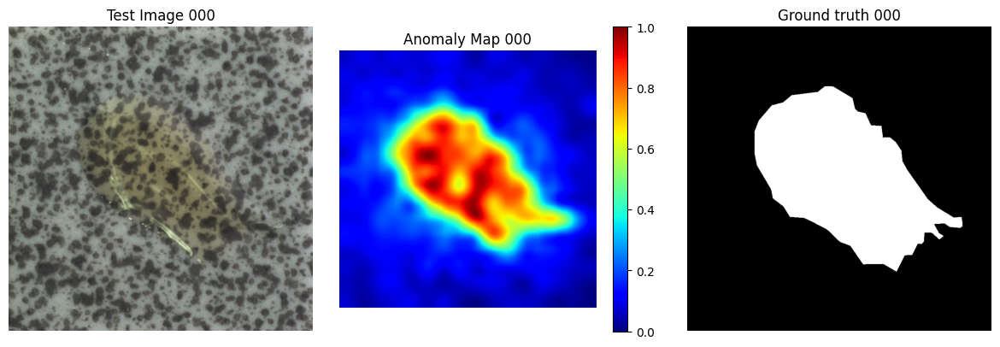

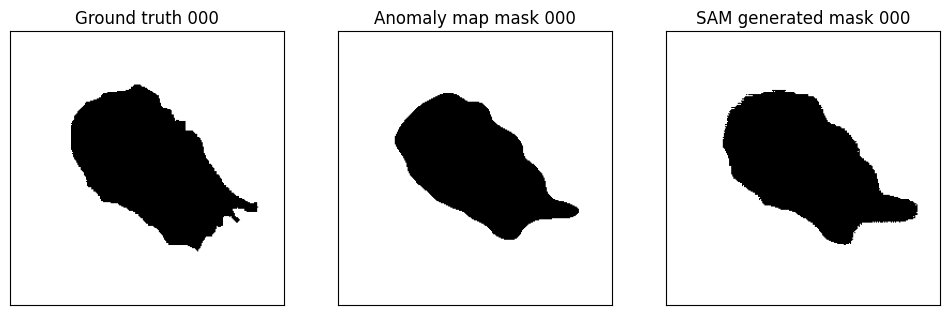

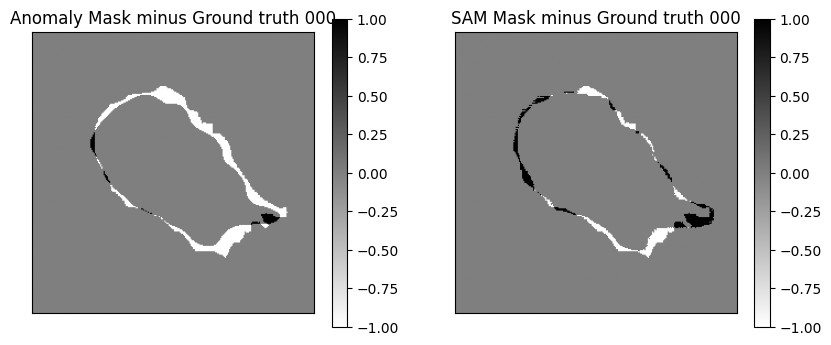

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


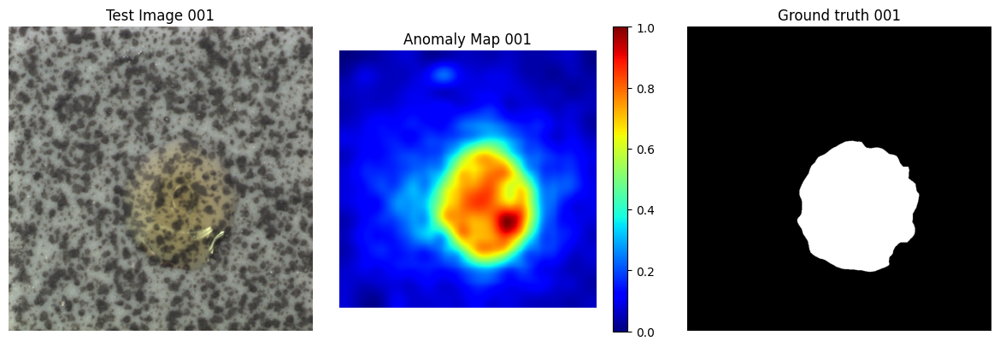

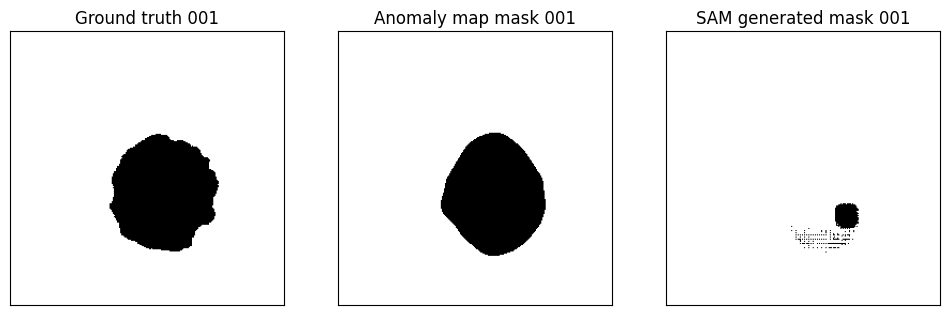

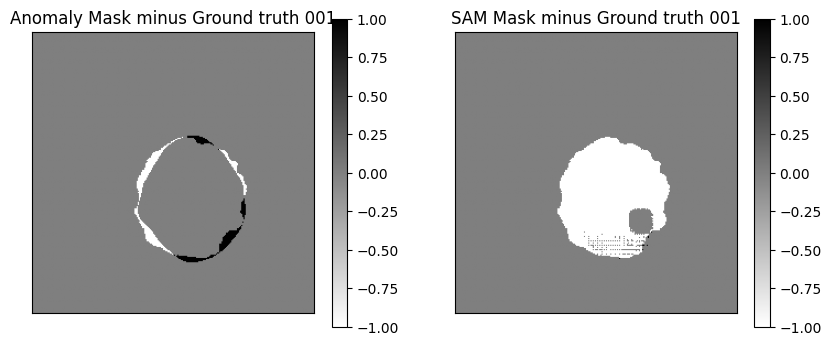

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


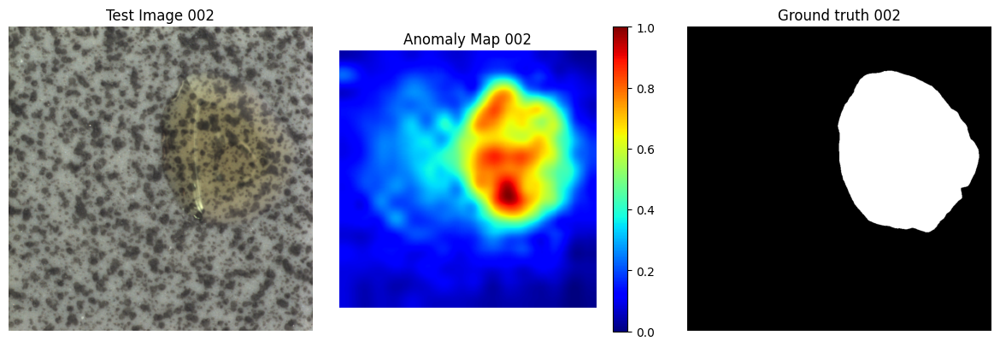

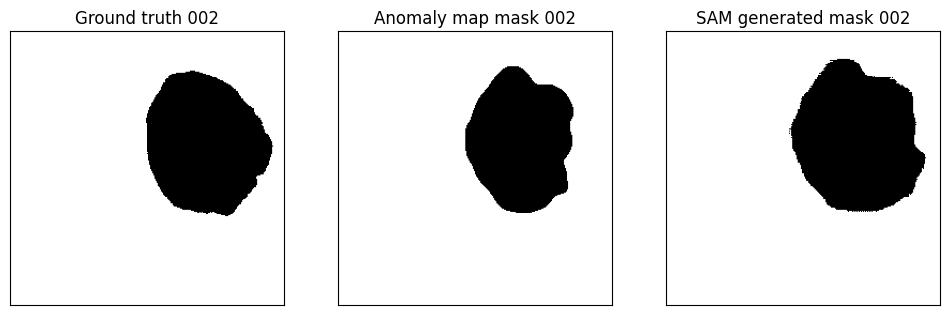

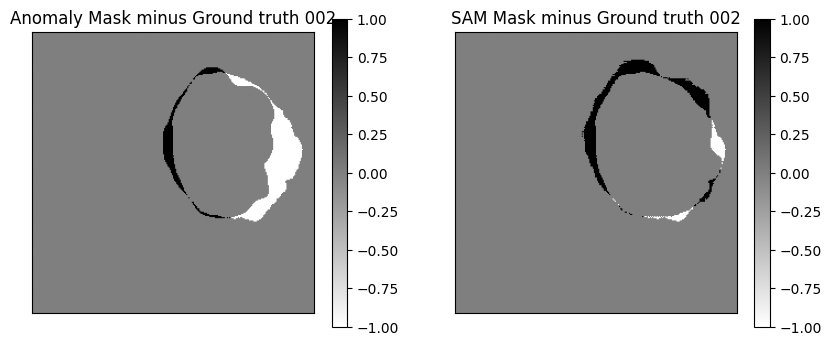

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


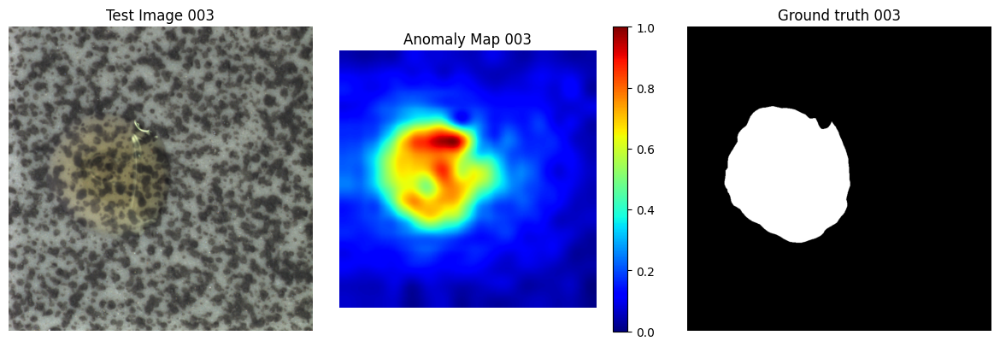

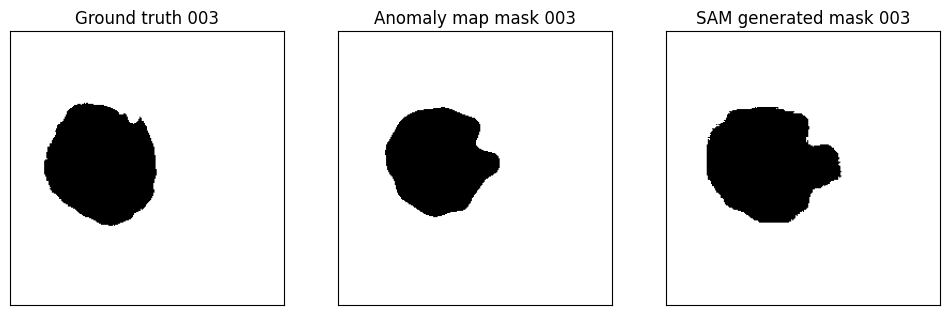

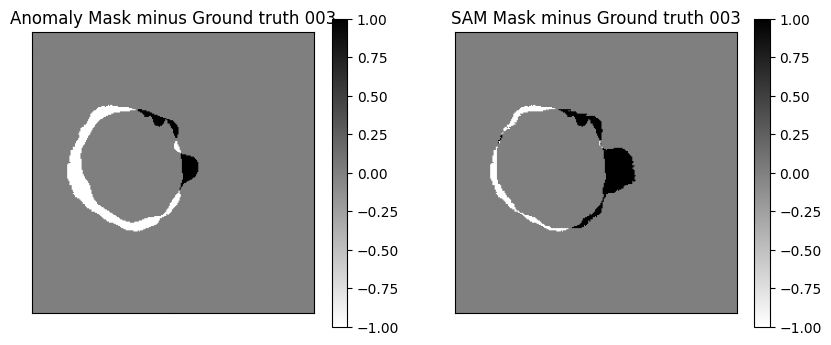

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


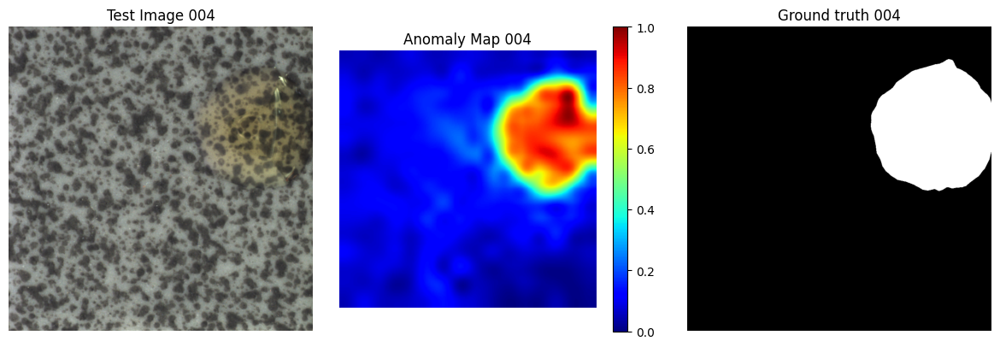

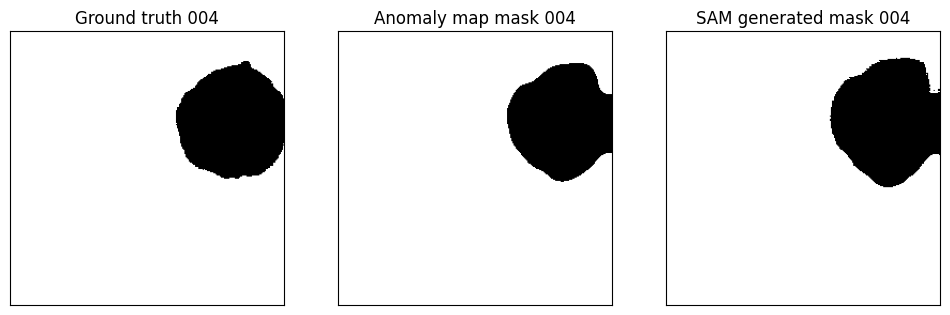

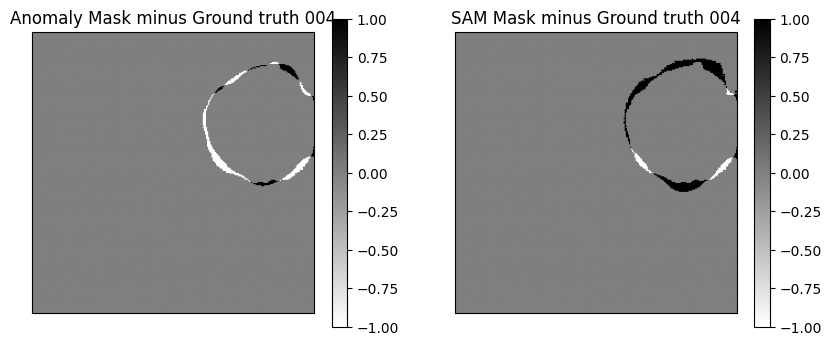

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


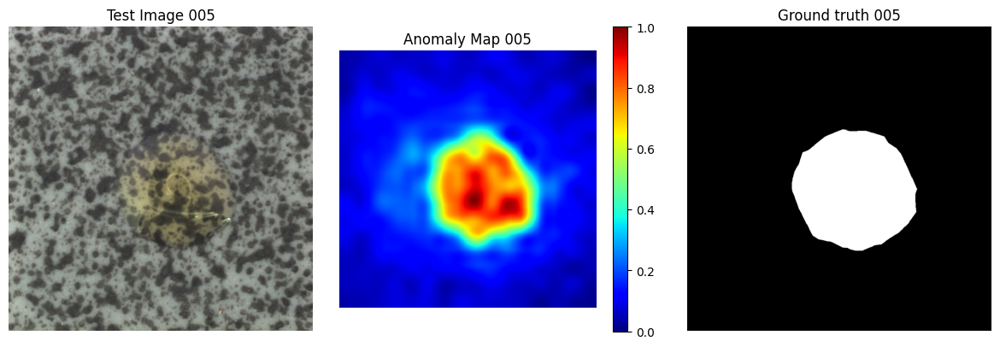

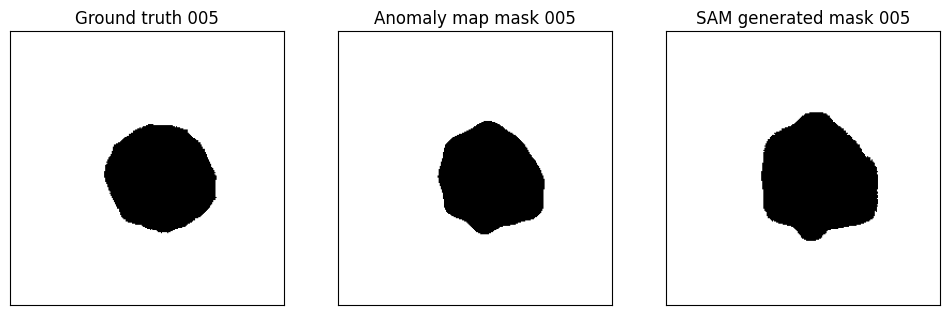

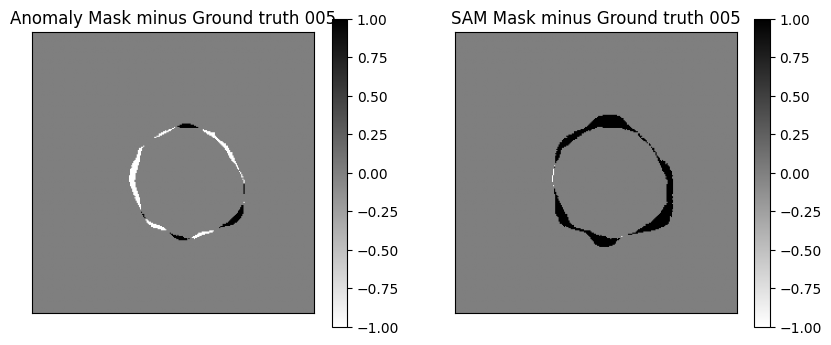

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


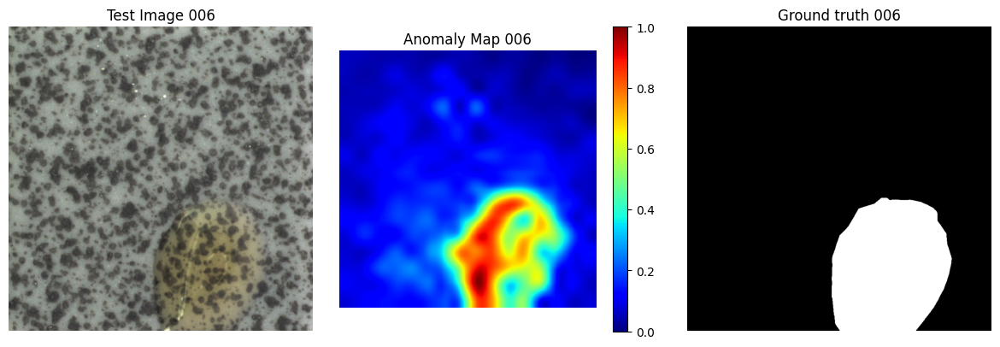

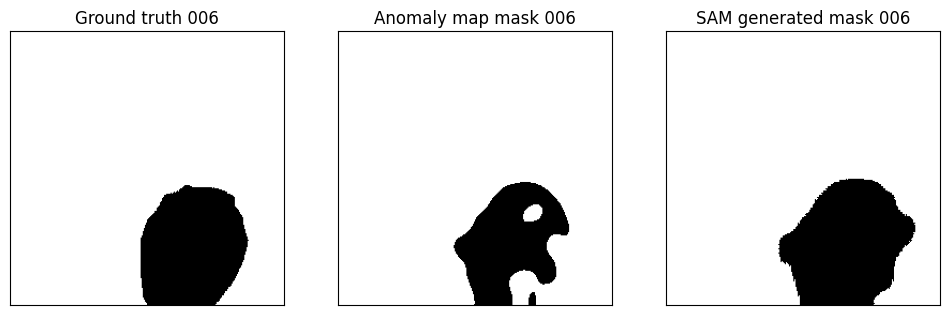

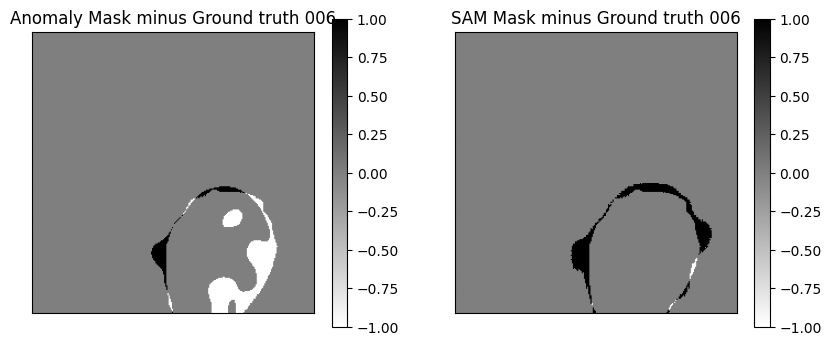

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


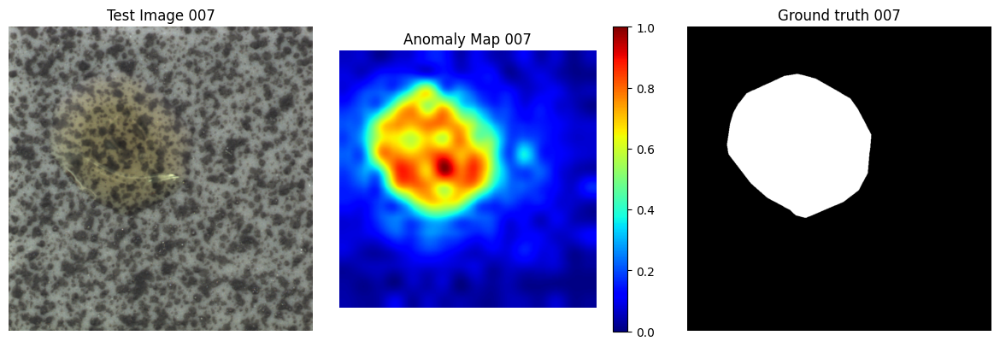

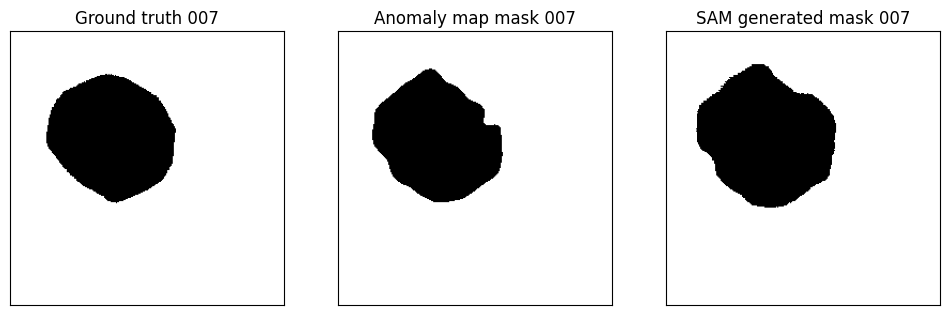

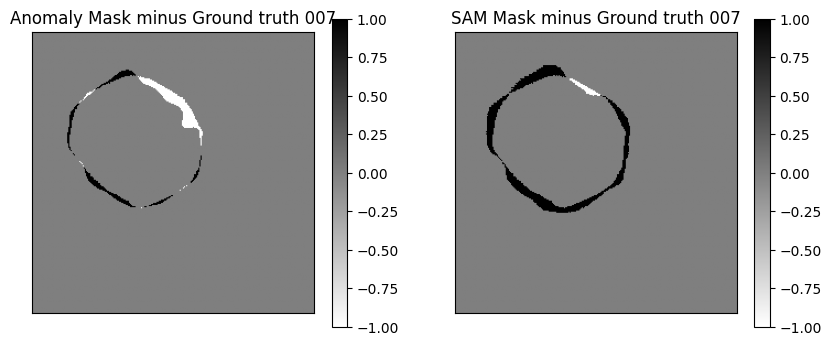

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


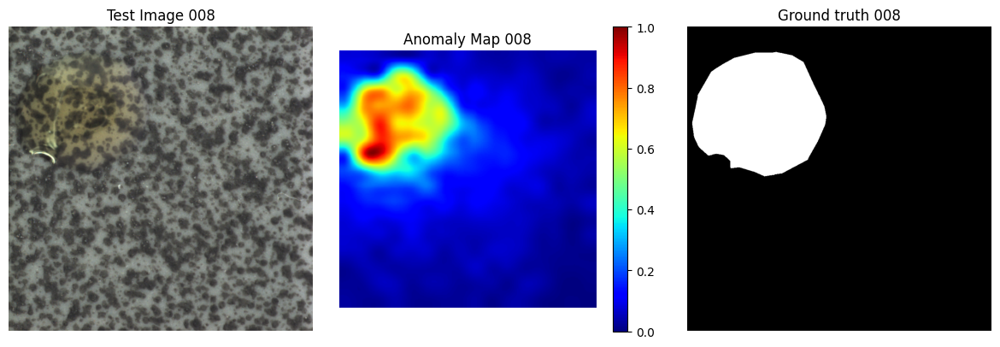

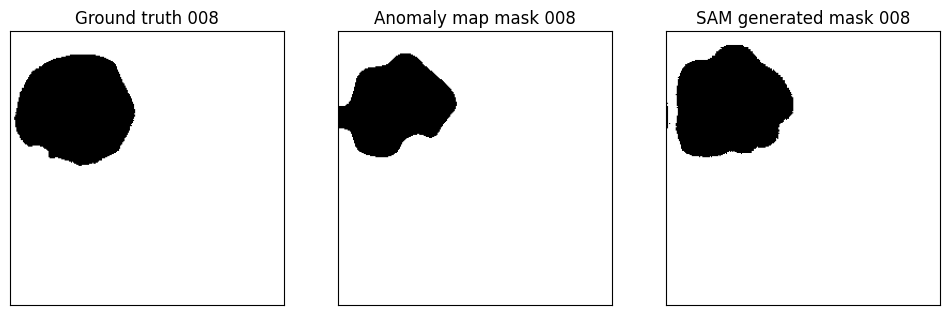

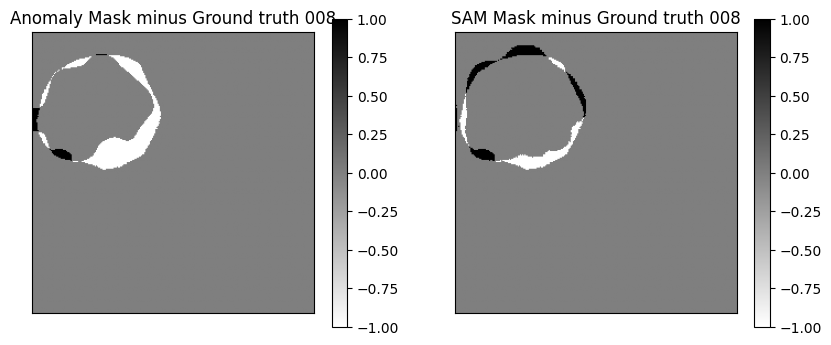

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


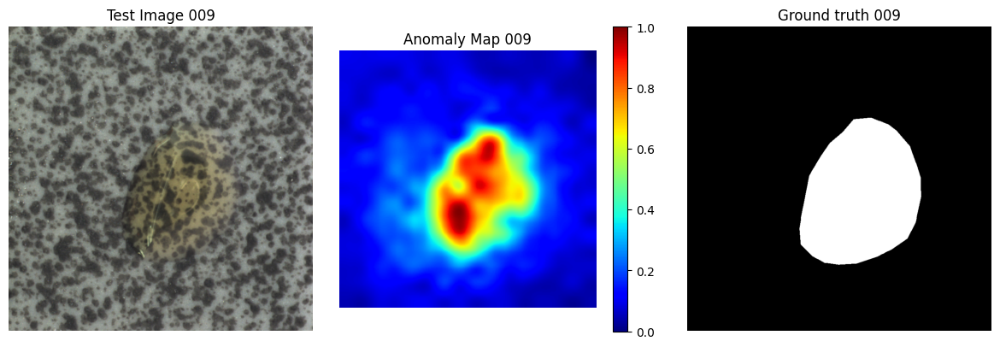

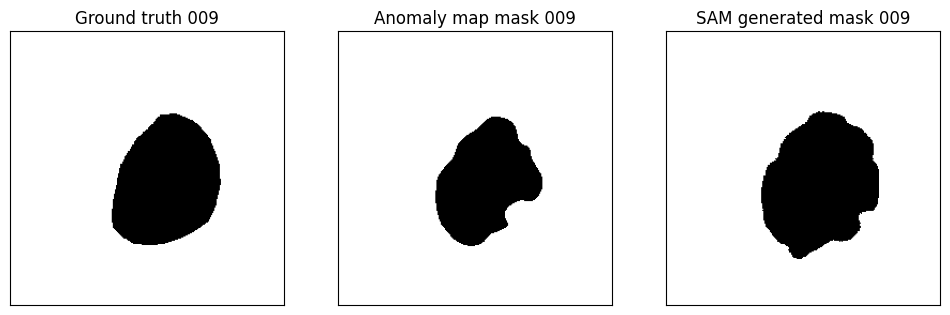

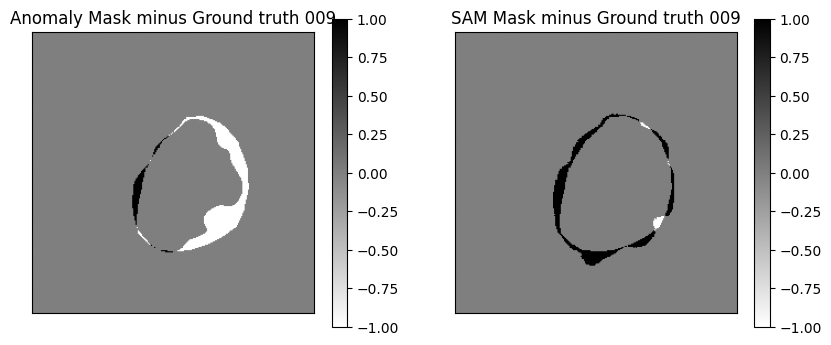

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


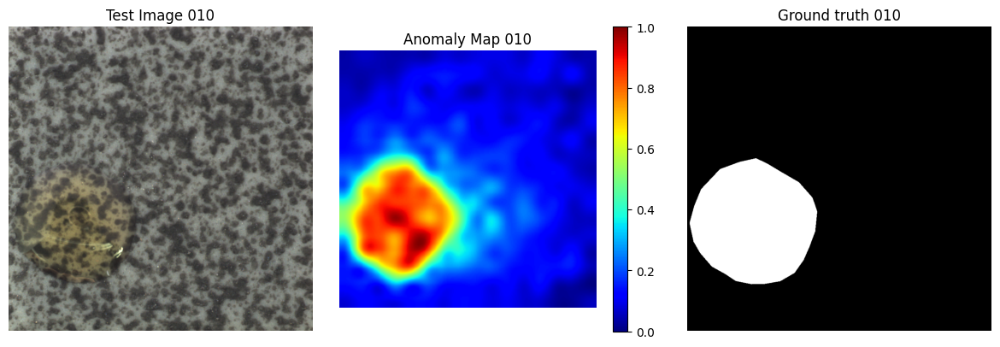

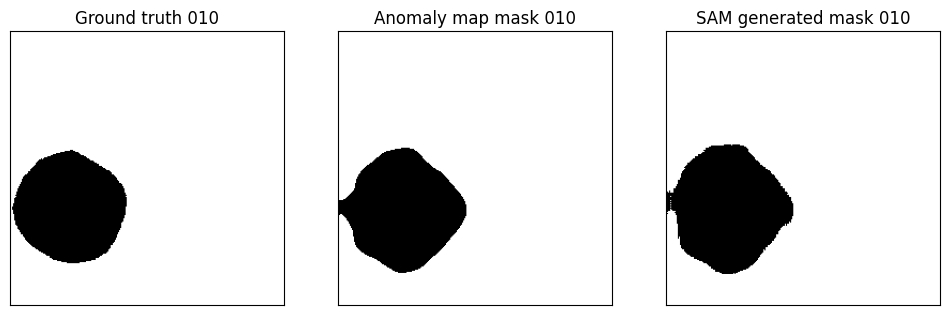

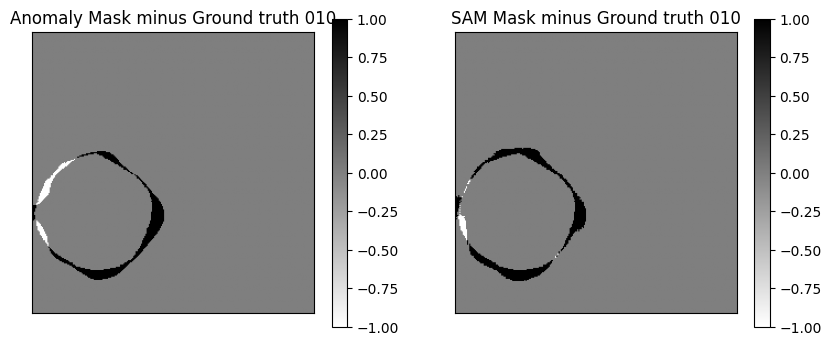

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


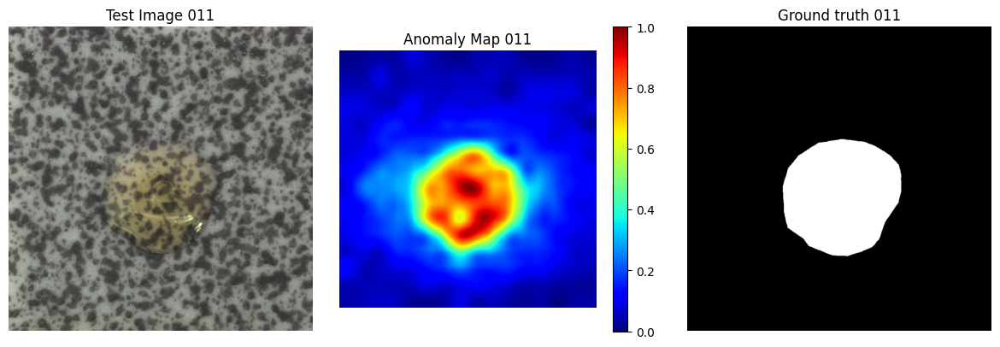

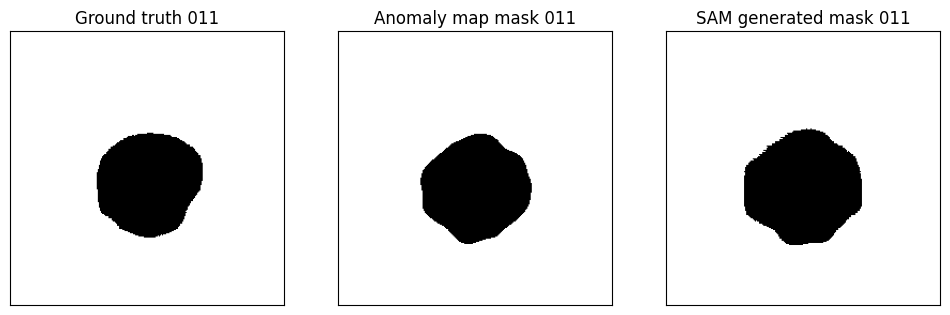

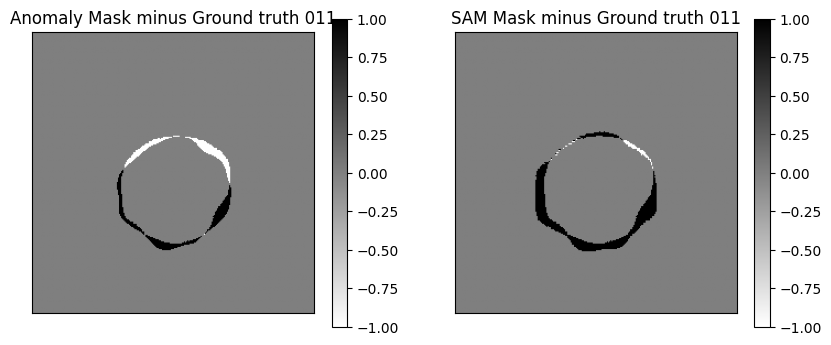

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


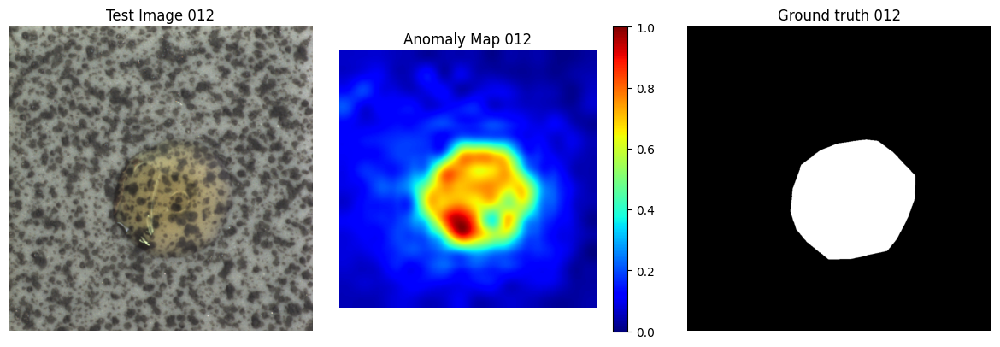

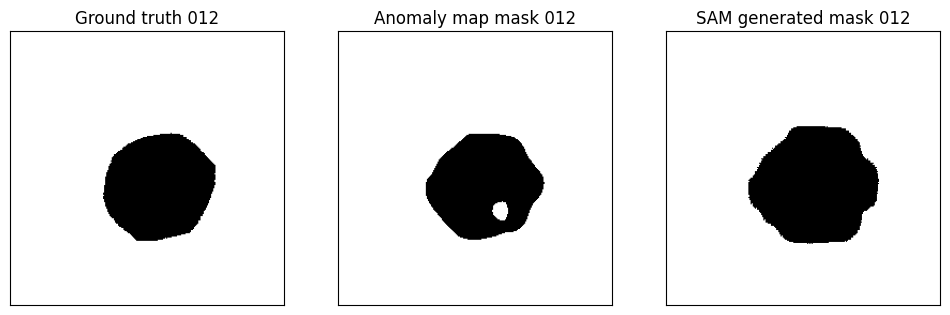

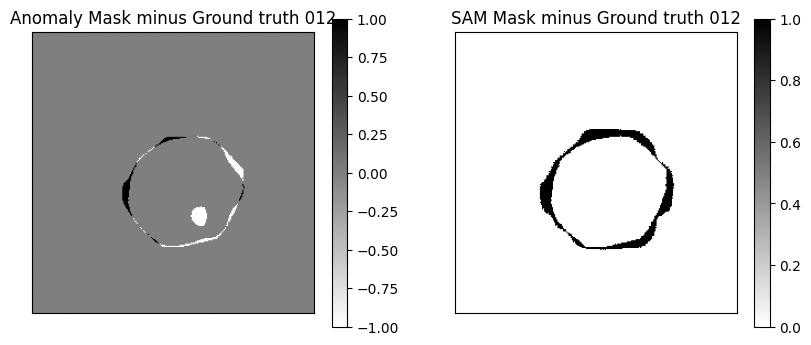

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


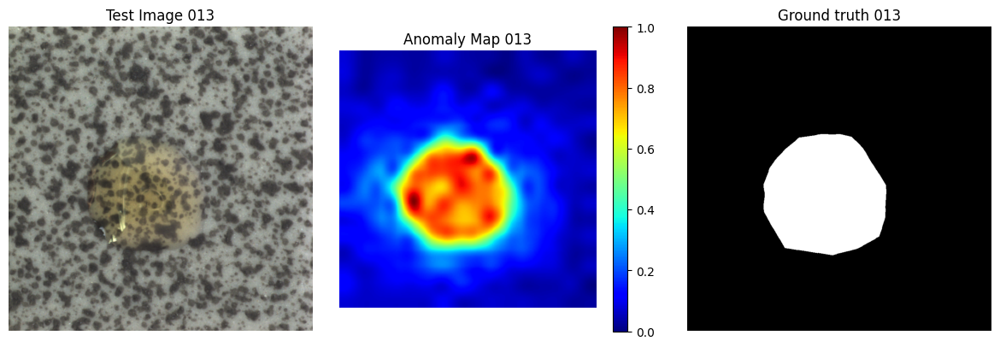

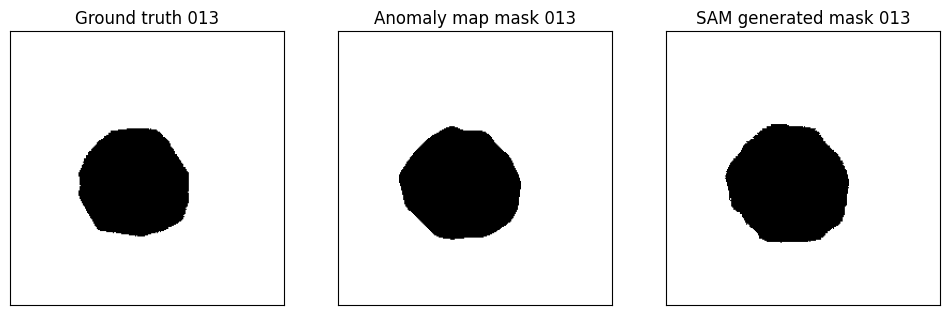

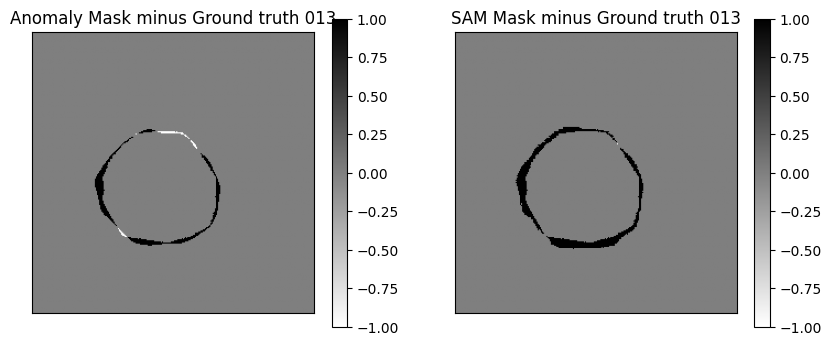

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


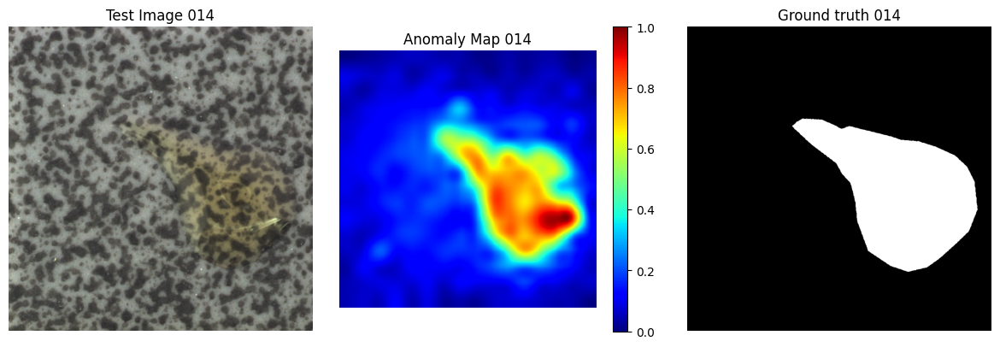

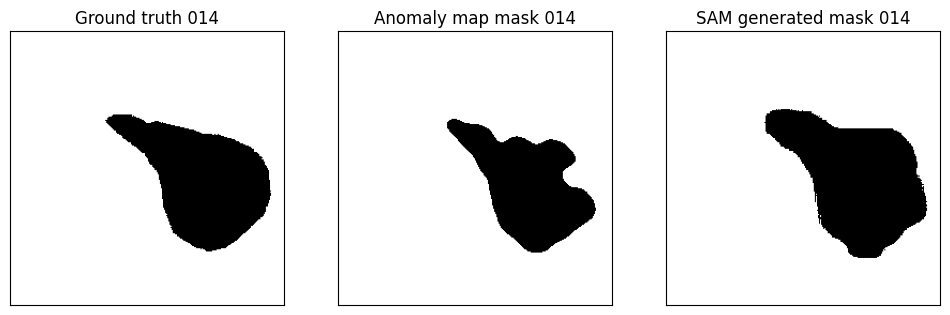

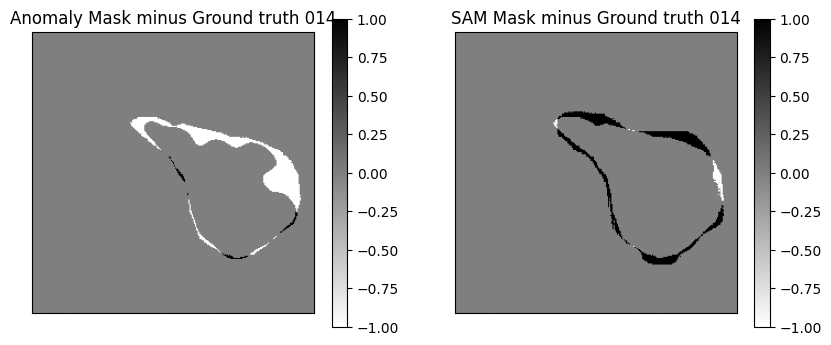

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


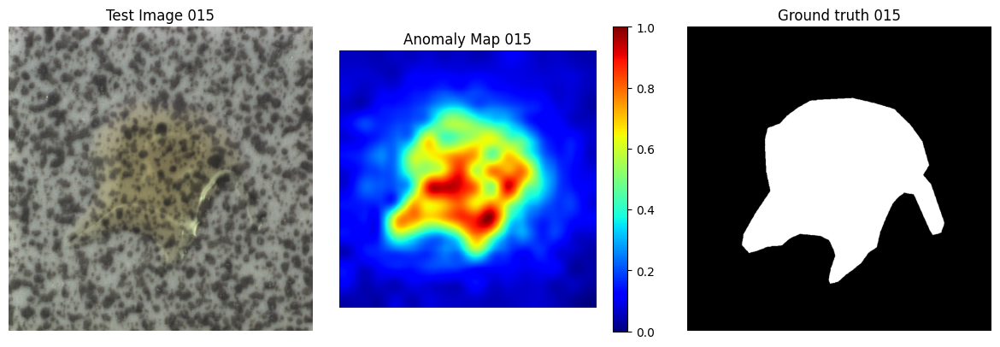

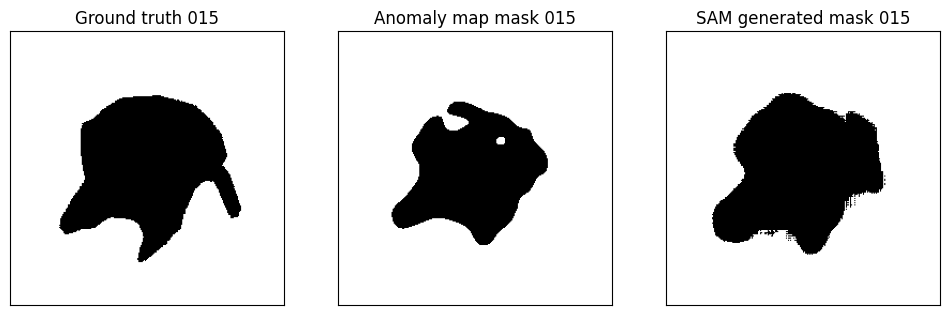

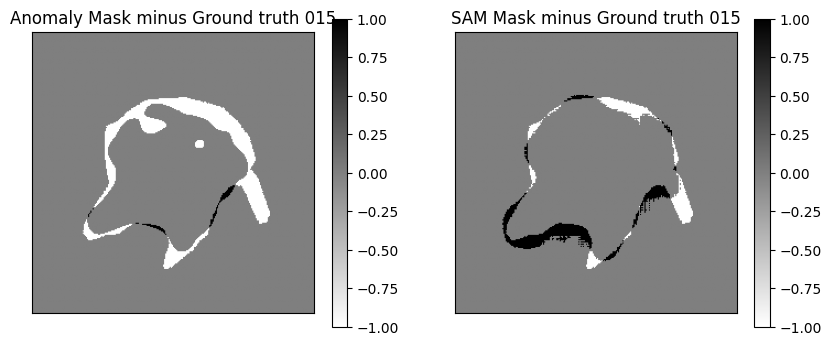

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


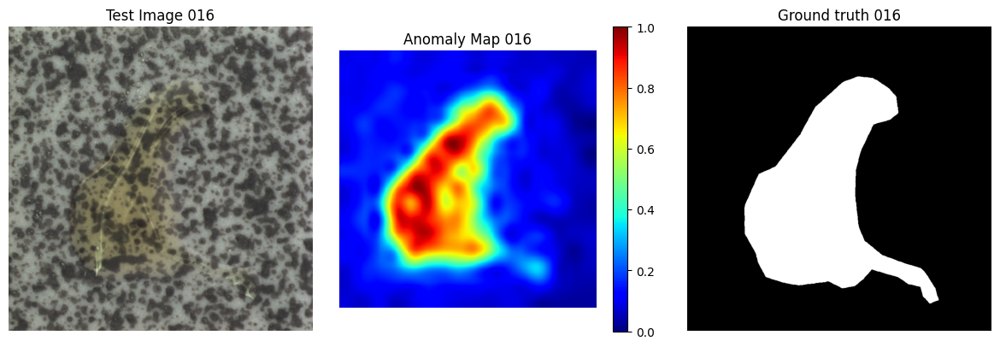

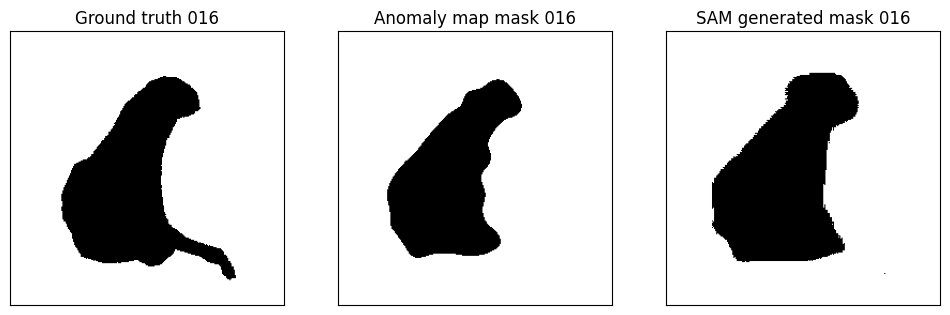

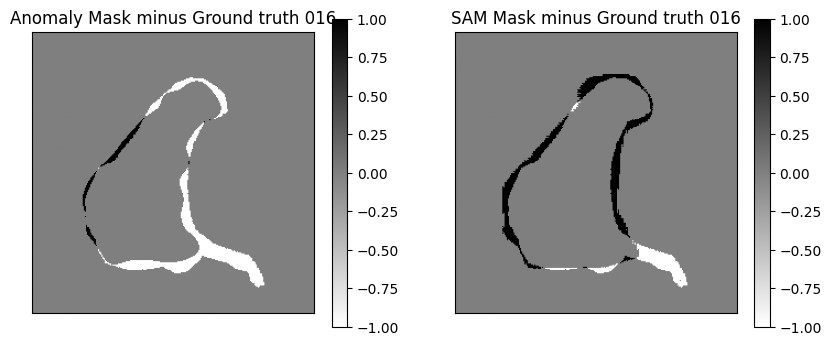

c:\Users\phili\anaconda3\envs\dinov3\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


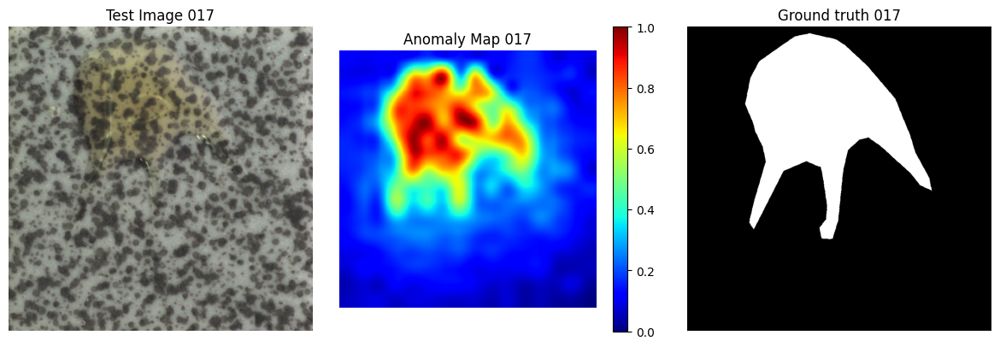

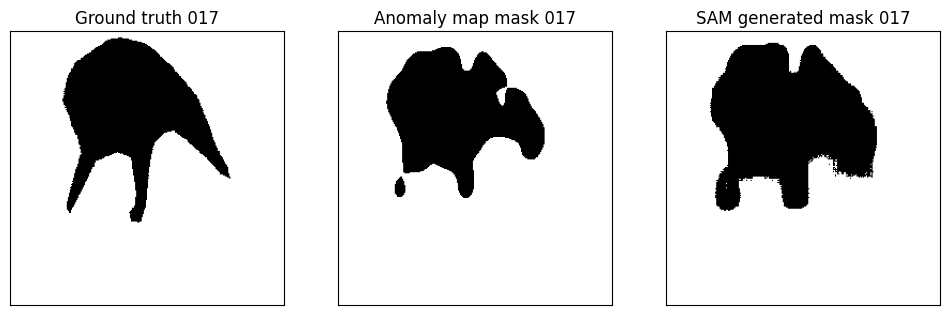

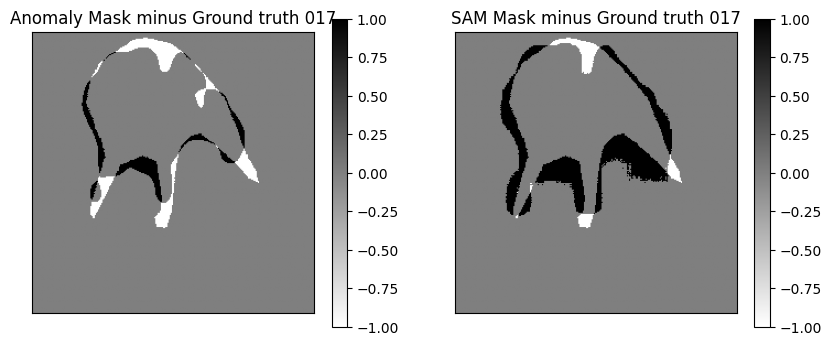

tile_oil_012 Dice overlap for Ground Truth and Anomaly Map mask:  0.8730381728414883
tile_oil_012 Dice overlap for Ground Truth and SAM mask:          0.8145942430776603
tile_oil_011 Dice overlap for Ground Truth and Anomaly Map mask:  0.8730381728414883
tile_oil_011 Dice overlap for Ground Truth and SAM mask:          0.8145942430776603
tile_oil_017 Dice overlap for Ground Truth and Anomaly Map mask:  0.8730381728414883
tile_oil_017 Dice overlap for Ground Truth and SAM mask:          0.8145942430776603
tile_oil_015 Dice overlap for Ground Truth and Anomaly Map mask:  0.8730381728414883
tile_oil_015 Dice overlap for Ground Truth and SAM mask:          0.8145942430776603
tile_oil_006 Dice overlap for Ground Truth and Anomaly Map mask:  0.8730381728414883
tile_oil_006 Dice overlap for Ground Truth and SAM mask:          0.8145942430776603
Average Dice Overlap score for Anomaly maps in tile/oil:  0.9004524899222424
Average Dice Overlap score for SAM mask map in tile/oil:  0.8638545086991

In [4]:
DATA_DIR = "mvtec_anomaly_detection/"

#We should add a loop here that goes over every dataset, and then save all the dice scores. And change show_images to false when doing that.

category = "tile"
anomaly = "oil"
use_test_image_num = False # set to True to set num_to_show equal to all the test images 
num_to_show = 5

show_images = True

# --- Load images ---
train_folder = DATA_DIR + f"{category}/train/good"
test_folder = DATA_DIR + f"{category}/test/{anomaly}"
ground_truth_folder = DATA_DIR + f"{category}/ground_truth/{anomaly}"

train_image_paths = sorted(glob.glob(train_folder + "/*.png"))
test_image_paths = sorted(glob.glob(test_folder + "/*.png"))
ground_truth_paths = sorted(glob.glob(ground_truth_folder + "/*.png"))

# Load images into PIL lists
Train_Images = [Image.open(p).convert("RGB") for p in train_image_paths]
Test_Images = [Image.open(p).convert("RGB") for p in test_image_paths]
Truth_Images = [Image.open(p).convert("RGB") for p in ground_truth_paths]

# --- Initialize model ---
model.eval()

# --- Initialize anomaly calculator object ---
anomaly_calculator = Calculate_Anomaly_And_Mask(model, Train_Images, Test_Images)

#Dont upscale, also, we think the pre_process could have been used for this exact purpose, we just didnt realize when we made it.
# anomaly_calculator.rescale_factor = 3.28
# anomaly_calculator.rescale_training = True
# anomaly_calculator.rescale_test = True

# --- Compute anomaly maps ---
Anomaly_Maps = anomaly_calculator.Compute_Anomaly_Mask7()  # shape [num_test, 256, 256]


# --- Visualize some random test images with their anomaly maps ---
if (use_test_image_num==True):
    num_to_show = len(Test_Images)
indices = random.sample(range(len(Test_Images)), num_to_show)


anomaly_map_dice_overlaps = []
SAM_mask_dice_overlaps = []


for idx in range(len(Test_Images)):#Original: for i, idx in enumerate(indices): #Change this if we want random ones, but i think we should calculate everything everytime to get a true average dice score preformance.
    anomaly_map_unnorm = Anomaly_Maps[idx]

    # Normalizing anomaly map (already did that in the function, but now the max value is 255)
    anomaly_map = (anomaly_map_unnorm - anomaly_map_unnorm.min()) / (anomaly_map_unnorm.max() - anomaly_map_unnorm.min()) * 255
    anomaly_map = anomaly_map.astype(np.uint8)
    cv2.imwrite(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map.png", anomaly_map)

    # Creating a simple mask where >= 0.5 * 255 intensity is marked as an anomaly
    anomaly_map_mask = np.where(anomaly_map >= 0.5 * 255, 1.0, 0.0)
    anomaly_map_mask = anomaly_map_mask.astype(int)
    cv2.imwrite(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map_mask.png", anomaly_map_mask)


    ground_truth_path = DATA_DIR + f"{category}/ground_truth/{anomaly}/{str(idx).zfill(3)}_mask.png"
    ground_truth = cv2.imread(ground_truth_path)

    # Resizing ground truth to 256 x 256
    ground_truth = cv2.resize(ground_truth, dsize=(256, 256), interpolation=cv2.INTER_CUBIC)[:, :, 1]
    ground_truth = (ground_truth - ground_truth.min()) / (ground_truth.max() - ground_truth.min())
    ground_truth = ground_truth.astype(int)

    # Finding local peaks for SAM Mask
    image_coords = cv2.imread(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map.png", cv2.IMREAD_GRAYSCALE)
    im = img_as_float(image_coords)
    image_max = ndi.maximum_filter(im, size=20, mode='constant')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(im, min_distance=20, threshold_rel=0.7)
    # print("Coordinates of local maxima:")
    # print(coordinates)  # Each row is (row, col) of a local maximum

    # Create SAM model
    sam_checkpoint = "sam_vit_b_01ec64.pth"
    model_type = "vit_b"
    # Added if statements for the people running on laptops.
    device = "cuda" if torch.cuda.is_available() else "cpu"
    #print(f"Using device: {device}") #Dont print

    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
    sam.to(device)



    image = cv2.imread(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map.png")
    # coordinates_copy = coordinates.copy()
    coordinates_flip = np.flip(coordinates, 1) # Flip to make coordinates make sense
    # print(coordinates_copy)
    predictor = SamPredictor(sam)
    predictor.set_image(image)
    input_point = coordinates_flip
    input_label = np.ones(len(input_point))

    # Create SAM mask
    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=False,
    )

    # Save SAM mask. 
    SAM_mask = masks[0].astype(int)
    cv2.imwrite(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_SAM_mask.png", SAM_mask)

    # Calculating Dice overlap scores
    anomaly_dice_overlap = f1_score(ground_truth.flatten(), anomaly_map_mask.flatten())
    SAM_dice_overlap = f1_score(ground_truth.flatten(), SAM_mask.flatten())
    anomaly_map_dice_overlaps.append(anomaly_dice_overlap)
    SAM_mask_dice_overlaps.append(SAM_dice_overlap)



    if (show_images==False):
        pass

    else:
        plt.figure(figsize=(12, 4))
        test_img = Test_Images[idx]
        ground_truth_image = Truth_Images[idx]
        
        # Show test image
        plt.subplot(1, 3, 1)
        plt.imshow(test_img)
        plt.title(f"Test Image {str(idx).zfill(3)}")
        plt.axis('off')

        # Show anomaly map
        plt.subplot(1, 3, 2)
        plt.imshow(anomaly_map_unnorm, cmap='jet', vmin = 0, vmax = 1)
        plt.title(f"Anomaly Map {str(idx).zfill(3)}")
        plt.axis('off')
        plt.colorbar()

        # Show ground truth
        plt.subplot(1, 3, 3)
        plt.imshow(ground_truth_image, cmap='binary')
        plt.title(f"Ground truth {str(idx).zfill(3)}")
        plt.axis('off')

        plt.tight_layout()
        plt.show()


        # Individual masks and Ground Truth
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(ground_truth, cmap="binary")
        plt.title(f"Ground truth {str(idx).zfill(3)}")
        # plt.axis("off")
        plt.yticks([])
        plt.xticks([])
        # plt.colorbar()
        plt.subplot(1, 3, 2)
        plt.imshow(anomaly_map_mask, cmap="binary")
        plt.title(f"Anomaly map mask {str(idx).zfill(3)}")
        # plt.axis("off")
        plt.yticks([])
        plt.xticks([])
        # plt.colorbar()
        plt.subplot(1, 3, 3)
        plt.imshow(SAM_mask, cmap="binary")
        plt.title(f"SAM generated mask {str(idx).zfill(3)}")
        # plt.axis("off")
        plt.yticks([])
        plt.xticks([])
        # plt.colorbar()
        plt.show()

        # Masks minus Ground Truth
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(anomaly_map_mask - ground_truth, cmap="binary")
        plt.title(f"Anomaly Mask minus Ground truth {str(idx).zfill(3)}")
        plt.yticks([])
        plt.xticks([])
        plt.colorbar()
        plt.subplot(1, 2, 2)
        plt.imshow(SAM_mask - ground_truth, cmap="binary")
        plt.title(f"SAM Mask minus Ground truth {str(idx).zfill(3)}")
        plt.yticks([])
        plt.xticks([])
        plt.colorbar()
        plt.show()

for idx in indices:
    print(f"{category}_{anomaly}_{str(idx).zfill(3)} Dice overlap for Ground Truth and Anomaly Map mask: ", anomaly_dice_overlap)
    print(f"{category}_{anomaly}_{str(idx).zfill(3)} Dice overlap for Ground Truth and SAM mask:         ", SAM_dice_overlap)

mean_anomaly_dice_overlap = sum(anomaly_map_dice_overlaps) / len(anomaly_map_dice_overlaps)
mean_SAM_dice_overlap = sum(SAM_mask_dice_overlaps) / len(SAM_mask_dice_overlaps)
print(f"Average Dice Overlap score for Anomaly maps in {category}/{anomaly}: ", mean_anomaly_dice_overlap)
print(f"Average Dice Overlap score for SAM mask map in {category}/{anomaly}: ", mean_SAM_dice_overlap)

tile_oil_001 Dice overlap for Ground Truth and Anomaly Map mask:  0.9319517663455129
tile_oil_001 Dice overlap for Ground Truth and SAM mask:          0.13178726725387446


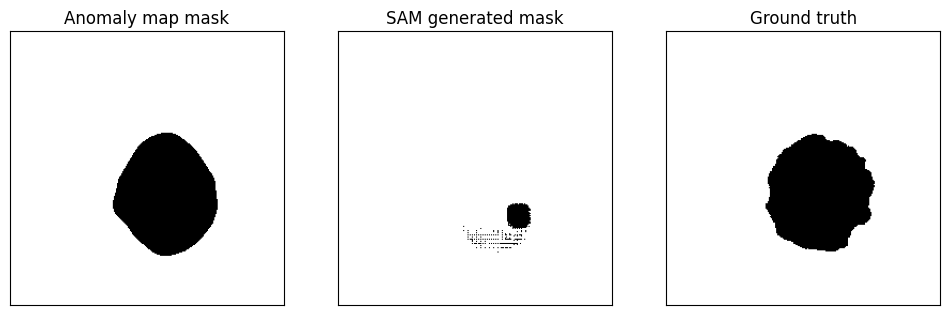

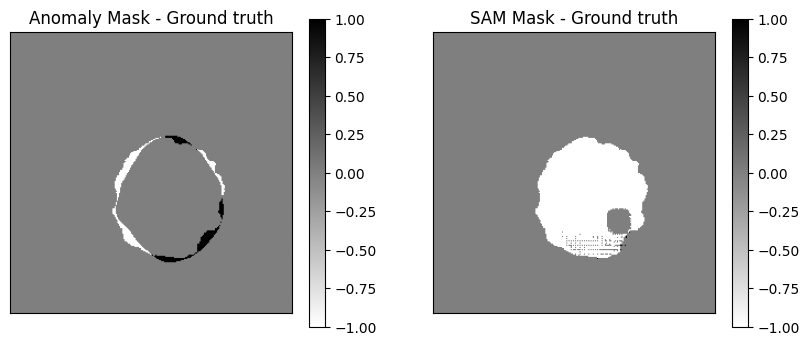

In [5]:
# To check individual anomalies

category = "tile"
anomaly = "oil"
idx = 1

anomaly_map_mask_to_show = cv2.imread(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map_mask.png", cv2.IMREAD_GRAYSCALE)
SAM_mask_to_show = cv2.imread(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_SAM_mask.png", cv2.IMREAD_GRAYSCALE)
ground_truth_path = DATA_DIR + f"{category}/ground_truth/{anomaly}/{str(idx).zfill(3)}_mask.png"
ground_truth = cv2.imread(ground_truth_path)
# Resizing ground truth to 256 x 256
ground_truth = cv2.resize(ground_truth, dsize=(256, 256), interpolation=cv2.INTER_CUBIC)[:, :, 1]
ground_truth = (ground_truth - ground_truth.min()) / (ground_truth.max() - ground_truth.min())
ground_truth_to_show = ground_truth.astype(int)

anomaly_dice_overlap = f1_score(ground_truth_to_show.flatten(), anomaly_map_mask_to_show.flatten())
SAM_dice_overlap = f1_score(ground_truth_to_show.flatten(), SAM_mask_to_show.flatten())
print(f"{category}_{anomaly}_{str(idx).zfill(3)} Dice overlap for Ground Truth and Anomaly Map mask: ", anomaly_dice_overlap)
print(f"{category}_{anomaly}_{str(idx).zfill(3)} Dice overlap for Ground Truth and SAM mask:         ", SAM_dice_overlap)


# Individual masks and Ground Truth
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(anomaly_map_mask_to_show, cmap="binary")
plt.title("Anomaly map mask")
# plt.axis("off")
plt.yticks([])
plt.xticks([])
# plt.colorbar()
plt.subplot(1, 3, 2)
plt.imshow(SAM_mask_to_show, cmap="binary")
plt.title("SAM generated mask")
# plt.axis("off")
plt.yticks([])
plt.xticks([])
# plt.colorbar()
plt.subplot(1, 3, 3)
plt.imshow(ground_truth_to_show, cmap="binary")
plt.title("Ground truth")
# plt.axis("off")
plt.yticks([])
plt.xticks([])
# plt.colorbar()
plt.show


# Masks minus Ground Truth
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(anomaly_map_mask_to_show - ground_truth_to_show, cmap="binary")
plt.title("Anomaly Mask - Ground truth")
plt.yticks([])
plt.xticks([])
plt.colorbar()
plt.subplot(1, 2, 2)
plt.imshow(SAM_mask_to_show - ground_truth_to_show, cmap="binary")
plt.title("SAM Mask - Ground truth")
plt.yticks([])
plt.xticks([])
plt.colorbar()


===== BEST / WORST RESULTS =====
Best SAM:    idx 0,   Dice=0.9429
Worst SAM:   idx 1,  Dice=0.1318
Best ANOM:   idx 4,  Dice=0.9544
Worst ANOM:  idx 6, Dice=0.8404


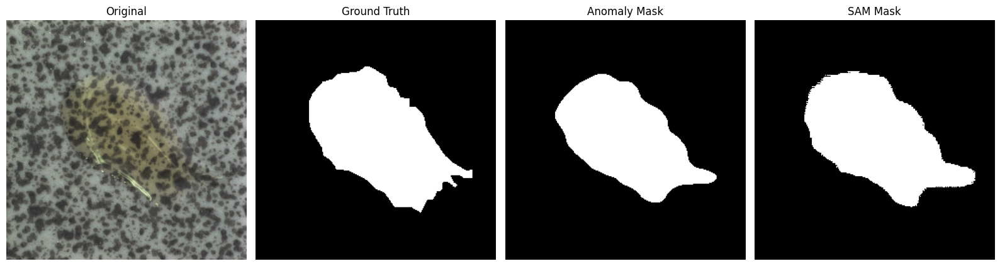

Saved: best_worst_examples\best_SAM_000.png


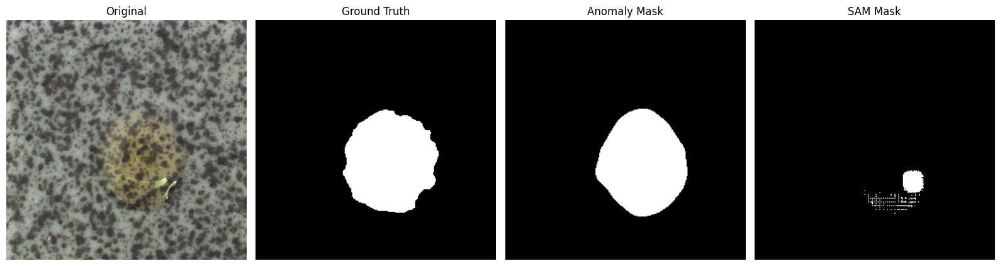

Saved: best_worst_examples\worst_SAM_001.png


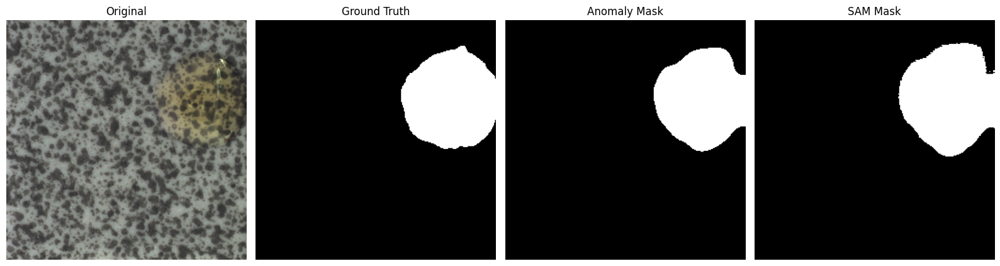

Saved: best_worst_examples\best_AnomalyMask_004.png


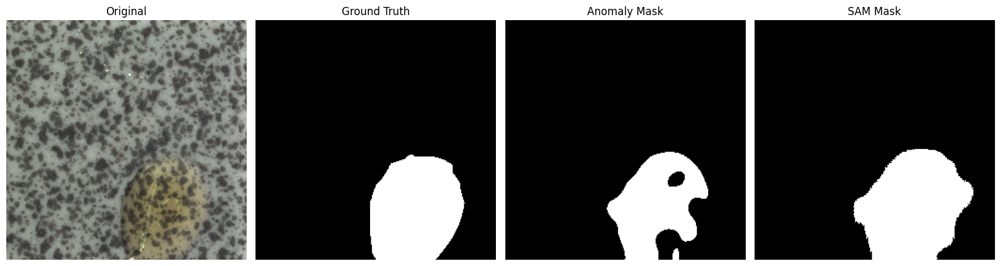

Saved: best_worst_examples\worst_AnomalyMask_006.png


In [6]:

#Added some code so we can see when each does good and bad. I used ChatGPT for a little help when making this.
save_dir = "best_worst_examples"

# Convert Dice lists to arrays
dice_sam = np.array(SAM_mask_dice_overlaps)
dice_anom = np.array(anomaly_map_dice_overlaps)

# Find best & worst indices for each method
best_sam   = np.argmax(dice_sam)
worst_sam  = np.argmin(dice_sam)

best_anom  = np.argmax(dice_anom)
worst_anom = np.argmin(dice_anom)

print("\n===== BEST / WORST RESULTS =====")
print(f"Best SAM:    idx {best_sam},   Dice={dice_sam[best_sam]:.4f}")
print(f"Worst SAM:   idx {worst_sam},  Dice={dice_sam[worst_sam]:.4f}")
print(f"Best ANOM:   idx {best_anom},  Dice={dice_anom[best_anom]:.4f}")
print(f"Worst ANOM:  idx {worst_anom}, Dice={dice_anom[worst_anom]:.4f}")


def visualize_and_save(idx, title_prefix):
    """Displays: original image, GT mask, anomaly mask, SAM mask"""
    
    # Load original image
    img = np.array(Test_Images[idx])

    # Load masks
    path_anom = f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map_mask.png"
    path_sam  = f"results/{category}_{anomaly}_{str(idx).zfill(3)}_SAM_mask.png"
    path_gt   = f"{DATA_DIR}{category}/ground_truth/{anomaly}/{str(idx).zfill(3)}_mask.png"

    anom_mask = cv2.imread(path_anom, cv2.IMREAD_GRAYSCALE).astype(int)
    sam_mask  = cv2.imread(path_sam,  cv2.IMREAD_GRAYSCALE).astype(int)

    gt_raw    = cv2.imread(path_gt)
    gt_mask   = cv2.resize(gt_raw, (256, 256))[:, :, 1]
    gt_mask   = ((gt_mask - gt_mask.min()) / (gt_mask.max() - gt_mask.min())).astype(int)

    # Plot results
    fig, axes = plt.subplots(1, 4, figsize=(16, 5))

    axes[0].imshow(img)
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(gt_mask, cmap="gray")
    axes[1].set_title("Ground Truth")
    axes[1].axis("off")

    axes[2].imshow(anom_mask, cmap="gray")
    axes[2].set_title("Anomaly Mask")
    axes[2].axis("off")

    axes[3].imshow(sam_mask, cmap="gray")
    axes[3].set_title("SAM Mask")
    axes[3].axis("off")

    plt.tight_layout()

    # Save
    outfile = os.path.join(save_dir, f"{title_prefix}_{str(idx).zfill(3)}.png")
    plt.savefig(outfile, dpi=150)
    plt.show()

    print(f"Saved: {outfile}")


# === GENERATE ALL BEST/WORST PLOTS ===
visualize_and_save(best_sam,  "best_SAM")
visualize_and_save(worst_sam, "worst_SAM")

visualize_and_save(best_anom,  "best_AnomalyMask")
visualize_and_save(worst_anom, "worst_AnomalyMask")

In [11]:
#Now calculate all the different scores and save them:

#Same as before, just copied some code and changed some things. I did use chat to help me make it though. 
# But we basically just add another loop that goes through different anomaly types and different catagories.
DATA_DIR = "mvtec_anomaly_detection/"
SCORES_DIR = "scores"
os.makedirs(SCORES_DIR, exist_ok=True)

# All MVTec categories
mvtec_categories = sorted(os.listdir(DATA_DIR))

# Output CSV file
csv_path = os.path.join(SCORES_DIR, "mvtec_all_scores.csv")

# CSV header
header = [
    "category",
    "anomaly_type",
    "num_images",
    "dice_anomaly_mean",
    "dice_anomaly_std",
    "dice_sam_mean",
    "dice_sam_std",
    "anom_score_mean_mean",
    "anom_score_mean_std",
    "anom_score_max_mean",
    "anom_score_max_std",
    "anom_score_percentile_mean",
    "anom_score_percentile_std"
]

# Create CSV
with open(csv_path, "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(header)

# Initialize SAM
sam_checkpoint = "sam_vit_b_01ec64.pth"
model_type = "vit_b"
device = "cuda" if torch.cuda.is_available() else "cpu"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
predictor = SamPredictor(sam)

# OUTER LOOP FOR ALL DATASETS

for category in mvtec_categories:

    test_dir = os.path.join(DATA_DIR, category, "test")

    # All anomaly types inside category
    anomalies = sorted(os.listdir(test_dir))

    for anomaly in anomalies:

        print(f"\n=== Processing {category}/{anomaly} ===")

        # ------------------------------
        # Load data for this dataset
        # ------------------------------

        
        train_folder = f"{DATA_DIR}{category}/train/good"
        test_folder = f"{DATA_DIR}{category}/test/{anomaly}"
        gt_folder = f"{DATA_DIR}{category}/ground_truth/{anomaly}"


        train_image_paths = sorted(glob.glob(train_folder + "/*.png"))
        test_image_paths = sorted(glob.glob(test_folder + "/*.png"))
        ground_truth_paths = sorted(glob.glob(gt_folder + "/*.png"))

        Train_Images = [Image.open(p).convert("RGB") for p in train_image_paths]
        Test_Images = [Image.open(p).convert("RGB") for p in test_image_paths]
        Truth_Images = [Image.open(p).convert("RGB") for p in ground_truth_paths]

        # ------------------------------
        # Run anomaly calculator
        # ------------------------------
        anomaly_calculator = Calculate_Anomaly_And_Mask(model, Train_Images, Test_Images)
        Anomaly_Maps = anomaly_calculator.Compute_Anomaly_Mask7()

        # Extract per-image anomaly scores (3 types)
        # Shape: (3, num_images)
        anomaly_scores = anomaly_calculator.Anomaly_Scores

        # ------------------------------
        # Evaluate segmentation (NO visualization)
        # ------------------------------
        anomaly_dice_list = []
        sam_dice_list = []
        SAM_mask_dice_overlaps = []
        anomaly_map_dice_overlaps = []
        for idx in tqdm(range(len(Test_Images)), desc=f"{category}/{anomaly} images"): #Now with a loading bar!
            anomaly_map_unnorm = Anomaly_Maps[idx]

            # Normalizing anomaly map (already did that in the function, but now the max value is 255)
            anomaly_map = (anomaly_map_unnorm - anomaly_map_unnorm.min()) / (anomaly_map_unnorm.max() - anomaly_map_unnorm.min()) * 255
            anomaly_map = anomaly_map.astype(np.uint8)
            cv2.imwrite(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map.png", anomaly_map)

            # Creating a simple mask where >= 0.5 * 255 intensity is marked as an anomaly
            anomaly_map_mask = np.where(anomaly_map >= 0.5 * 255, 1.0, 0.0)
            anomaly_map_mask = anomaly_map_mask.astype(np.uint8)
            cv2.imwrite(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map_mask.png", anomaly_map_mask)
            # We only have a ground truth for anomaly data, so we need an if statement here:
            if anomaly=="good":
                anomaly_map_dice_overlaps = ""
                anomaly_map_dice_overlaps = ""
            else:
                ground_truth_path = DATA_DIR + f"{category}/ground_truth/{anomaly}/{str(idx).zfill(3)}_mask.png"
                ground_truth = cv2.imread(ground_truth_path)

                # Resizing ground truth to 256 x 256
                ground_truth = cv2.resize(ground_truth, dsize=(256, 256), interpolation=cv2.INTER_CUBIC)[:, :, 1]
                ground_truth = (ground_truth - ground_truth.min()) / (ground_truth.max() - ground_truth.min())
                ground_truth = (ground_truth > 0).astype(np.uint8)  # binary mask
                #ground_truth = ground_truth.astype(int)

                # Finding local peaks for SAM Mask
                image_coords = cv2.imread(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map.png", cv2.IMREAD_GRAYSCALE)
                im = img_as_float(image_coords)
                image_max = ndi.maximum_filter(im, size=20, mode='constant')
                # Comparison between image_max and im to find the coordinates of local maxima
                coordinates = peak_local_max(im, min_distance=20, threshold_rel=0.7)
                # print("Coordinates of local maxima:")
                # print(coordinates)  # Each row is (row, col) of a local maximum

                image = cv2.imread(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_anomaly_map.png")
                # coordinates_copy = coordinates.copy()
                coordinates_flip = np.flip(coordinates, 1) # Flip to make coordinates make sense
                # print(coordinates_copy)
                predictor = SamPredictor(sam)
                predictor.set_image(image)
                input_point = coordinates_flip
                input_label = np.ones(len(input_point))

                # Create SAM mask
                masks, scores, logits = predictor.predict(
                    point_coords=input_point,
                    point_labels=input_label,
                    multimask_output=False,
                )

                # Save SAM mask. 
                SAM_mask = masks[0].astype(int)
                cv2.imwrite(f"results/{category}_{anomaly}_{str(idx).zfill(3)}_SAM_mask.png", SAM_mask)

                # Calculating Dice overlap scores
                anomaly_dice_overlap = f1_score(ground_truth.flatten(), anomaly_map_mask.flatten())
                SAM_dice_overlap = f1_score(ground_truth.flatten(), SAM_mask.flatten())
                anomaly_map_dice_overlaps.append(anomaly_dice_overlap)
                SAM_mask_dice_overlaps.append(SAM_dice_overlap)

        if anomaly=="good":
            mean_dice_anom = ""
            std_dice_anom = ""
            mean_dice_sam = ""
            std_dice_sam = ""
        else:
            # Convert lists → np arrays
            anomaly_dice_list = np.array(anomaly_map_dice_overlaps) #Weird names i know.
            sam_dice_list = np.array(SAM_mask_dice_overlaps)

            # ------------------------------
            # Compute summary statistics
            # ------------------------------
            mean_dice_anom = f"'{np.mean(anomaly_dice_list):.5f}"
            std_dice_anom = f"'{np.std(anomaly_dice_list):.5f}"

            mean_dice_sam = f"'{np.mean(sam_dice_list):.5f}"
            std_dice_sam = f"'{np.std(sam_dice_list):.5f}"

        # Anomaly scores (shape: 3 × N)
        score_mean = anomaly_scores[0]  # per-image mean score
        score_max = anomaly_scores[1]   # per-image max score
        score_pct = anomaly_scores[2]   # per-image percentile95 score

        # Compute stats
        score_mean_avg = np.mean(score_mean)
        score_mean_std = np.std(score_mean)

        score_max_avg = np.mean(score_max)
        score_max_std = np.std(score_max)

        score_pct_avg = np.mean(score_pct)
        score_pct_std = np.std(score_pct)

        # ------------------------------
        # Save to CSV
        # ------------------------------
        with open(csv_path, "a", newline="") as f:
            writer = csv.writer(f, delimiter=';')
            writer.writerow([
                category,
                anomaly,
                len(Test_Images),
            mean_dice_anom,
            std_dice_anom,
            mean_dice_sam,
            std_dice_sam,
            f"'{score_mean_avg:.5f}",
            f"'{score_mean_std:.5f}",
            f"'{score_max_avg:.5f}",
            f"'{score_max_std:.5f}",
            f"'{score_pct_avg:.5f}",
            f"'{score_pct_std:.5f}"
            ])

        print(f"Saved stats for {category}/{anomaly}\n")
        print(f'Mean Dice: {category}/{anomaly} {mean_dice_anom}') #Testing with a print statement

print("\nSaved full CSV to:", csv_path)


=== Processing bottle/broken_large ===


bottle/broken_large images: 100%|██████████| 20/20 [04:31<00:00, 13.56s/it]


Saved stats for bottle/broken_large

Mean Dice: bottle/broken_large 0.6843

=== Processing bottle/broken_small ===


bottle/broken_small images:  18%|█▊        | 4/22 [01:01<04:38, 15.49s/it]


KeyboardInterrupt: 